#### IMPORTING ALL THE REQUIRED LIBRARIES

In [1]:
import numpy as np
import pandas as pd
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns

C:\Users\Bharg\anaconda3\lib\site-packages\scipy\__init__.py:155: UserWarning: A NumPy version >=1.18.5 and <1.25.0 is required for this version of SciPy (detected version 1.26.2
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
df = pd.read_csv(r'C:\Users\Bharg\Data science udemy\Simpli learn classes\Walmart_Store_sales.csv')

#### Uploaded the data file and checking the data

In [3]:
df.head()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,05-02-2010,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,12-02-2010,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,19-02-2010,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,26-02-2010,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,05-03-2010,1554806.68,0,46.50,2.625,211.350143,8.106


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Store         6435 non-null   int64  
 1   Date          6435 non-null   object 
 2   Weekly_Sales  6435 non-null   float64
 3   Holiday_Flag  6435 non-null   int64  
 4   Temperature   6435 non-null   float64
 5   Fuel_Price    6435 non-null   float64
 6   CPI           6435 non-null   float64
 7   Unemployment  6435 non-null   float64
dtypes: float64(5), int64(2), object(1)
memory usage: 402.3+ KB


#### Checked the statistics of data and null values, missing values and perfomed sanity checking in the following cells

In [5]:
df.describe()

,Store,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
count,6435.000000,6.435000e+03,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000
mean,23.000000,1.046965e+06,0.069930,60.663782,3.358607,171.578394,7.999151
std,12.988182,5.643666e+05,0.255049,18.444933,0.459020,39.356712,1.875885
min,1.000000,2.099862e+05,0.000000,-2.060000,2.472000,126.064000,3.879000
25%,12.000000,5.533501e+05,0.000000,47.460000,2.933000,131.735000,6.891000
50%,23.000000,9.607460e+05,0.000000,62.670000,3.445000,182.616521,7.874000
75%,34.000000,1.420159e+06,0.000000,74.940000,3.735000,212.743293,8.622000
max,45.000000,3.818686e+06,1.000000,100.140000,4.468000,227.232807,14.313000


In [6]:
df.isna().sum()

Store           0
Date            0
Weekly_Sales    0
Holiday_Flag    0
Temperature     0
Fuel_Price      0
CPI             0
Unemployment    0
dtype: int64

In [7]:
df.iloc[0]['Date']

'05-02-2010'

In [8]:
type(df.iloc[0]['Date'])

str

In [9]:
df['Date'].dtype

dtype('O')

In [10]:
df['Date'] = pd.to_datetime(df['Date'], dayfirst=True)

In [11]:
type(df.iloc[0]['Date'])

pandas._libs.tslibs.timestamps.Timestamp

In [12]:
df.head()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,2010-02-05,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,2010-02-12,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,2010-02-19,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,2010-02-26,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,2010-03-05,1554806.68,0,46.50,2.625,211.350143,8.106


In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Store         6435 non-null   int64         
 1   Date          6435 non-null   datetime64[ns]
 2   Weekly_Sales  6435 non-null   float64       
 3   Holiday_Flag  6435 non-null   int64         
 4   Temperature   6435 non-null   float64       
 5   Fuel_Price    6435 non-null   float64       
 6   CPI           6435 non-null   float64       
 7   Unemployment  6435 non-null   float64       
dtypes: datetime64[ns](1), float64(5), int64(2)
memory usage: 402.3 KB


In [14]:
df['Holiday_Flag'].unique()

array([0, 1], dtype=int64)

In [15]:
df['Store'].unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45], dtype=int64)

#### Checking the data for duplicate records

In [16]:
df[df.duplicated()]

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment


## Q1- Which store has maximum sales?

In [17]:
df.groupby('Store').sum()['Weekly_Sales'].nlargest(1).astype('int64')

Store
20    301397792
Name: Weekly_Sales, dtype: int64

In [18]:
df1 = pd.DataFrame(df.groupby('Store').sum()['Weekly_Sales'].astype('int64')).sort_values('Weekly_Sales', ascending=True)

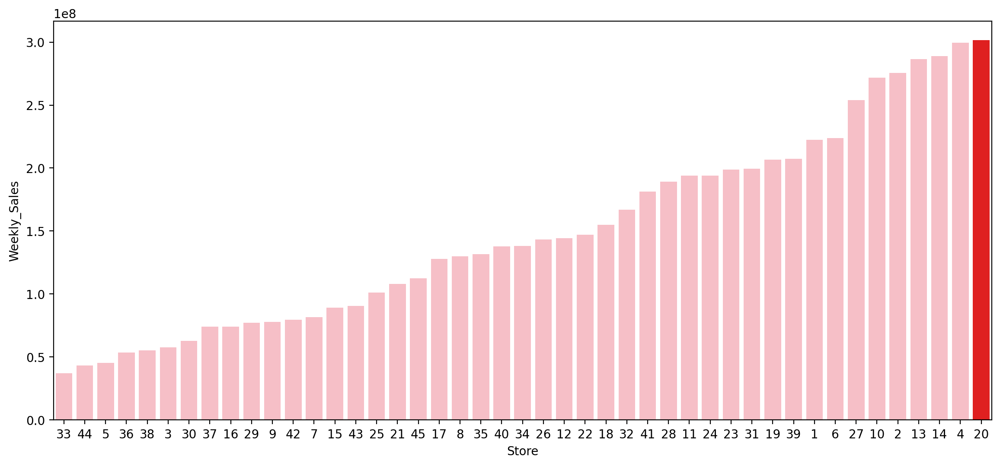

In [19]:
plt.figure(figsize = (14,6), dpi=200)
cols = ['red' if (x == max(df1.Weekly_Sales)) else 'lightpink' for x in df1.Weekly_Sales]
sns.barplot(data= df1, x= df1.index, y='Weekly_Sales', order=df1.sort_values('Weekly_Sales').index, palette=cols);

# Store 20 has maximum sales. 

In [20]:
df.describe()

,Store,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
count,6435.000000,6.435000e+03,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000
mean,23.000000,1.046965e+06,0.069930,60.663782,3.358607,171.578394,7.999151
std,12.988182,5.643666e+05,0.255049,18.444933,0.459020,39.356712,1.875885
min,1.000000,2.099862e+05,0.000000,-2.060000,2.472000,126.064000,3.879000
25%,12.000000,5.533501e+05,0.000000,47.460000,2.933000,131.735000,6.891000
50%,23.000000,9.607460e+05,0.000000,62.670000,3.445000,182.616521,7.874000
75%,34.000000,1.420159e+06,0.000000,74.940000,3.735000,212.743293,8.622000
max,45.000000,3.818686e+06,1.000000,100.140000,4.468000,227.232807,14.313000


## Which store has maximum standard deviation i.e., the sales vary a lot. Also, find out the coefficient of mean to standard deviation

In [21]:
df.groupby('Store').std()['Weekly_Sales'].nlargest(1)

Store
14    317569.949476
Name: Weekly_Sales, dtype: float64

In [22]:
df2 = pd.DataFrame(df.groupby('Store').std()['Weekly_Sales']).rename(columns={'Weekly_Sales': 'Weekly sales standard deviation'}).round(3)

In [23]:
df2.head()

,Weekly sales standard deviation
Store,
1,155980.768
2,237683.695
3,46319.632
4,266201.442
5,37737.966


In [24]:
df3 = pd.DataFrame(df.groupby('Store').mean()['Weekly_Sales']).rename(columns={'Weekly_Sales': 'Weekly sales mean'}).round(3)
df3.head()

,Weekly sales mean
Store,
1,1555264.398
2,1925751.336
3,402704.441
4,2094712.961
5,318011.810


## Coefficient of mean to standard deviation for every store with respect to sales

In [25]:
df2['Weekly sales standard deviation']/df3['Weekly sales mean']

Store
1     0.100292
2     0.123424
3     0.115021
4     0.127083
5     0.118668
6     0.135823
7     0.197305
8     0.116953
9     0.126895
10    0.159133
11    0.122262
12    0.137925
13    0.132514
14    0.157137
15    0.193384
16    0.165181
17    0.125521
18    0.162845
19    0.132680
20    0.130903
21    0.170292
22    0.156783
23    0.179721
24    0.123637
25    0.159860
26    0.110111
27    0.135155
28    0.137330
29    0.183742
30    0.052008
31    0.090161
32    0.118310
33    0.092868
34    0.108225
35    0.229681
36    0.162579
37    0.042084
38    0.110875
39    0.149908
40    0.123430
41    0.148177
42    0.090335
43    0.064104
44    0.081793
45    0.165613
dtype: float64

## Which store/s has good quarterly growth rate in Q3’2012?

In [26]:
df['year'] = df['Date'].dt.year
df['month'] = df['Date'].dt.month
df['Quarter'] = df['Date'].dt.quarter

In [27]:
df.head()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,year,month,Quarter
0,1,2010-02-05,1643690.90,0,42.31,2.572,211.096358,8.106,2010,2,1
1,1,2010-02-12,1641957.44,1,38.51,2.548,211.242170,8.106,2010,2,1
2,1,2010-02-19,1611968.17,0,39.93,2.514,211.289143,8.106,2010,2,1
3,1,2010-02-26,1409727.59,0,46.63,2.561,211.319643,8.106,2010,2,1
4,1,2010-03-05,1554806.68,0,46.50,2.625,211.350143,8.106,2010,3,1


In [28]:
df.tail()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,year,month,Quarter
6430,45,2012-09-28,713173.95,0,64.88,3.997,192.013558,8.684,2012,9,3
6431,45,2012-10-05,733455.07,0,64.89,3.985,192.170412,8.667,2012,10,4
6432,45,2012-10-12,734464.36,0,54.47,4.000,192.327265,8.667,2012,10,4
6433,45,2012-10-19,718125.53,0,56.47,3.969,192.330854,8.667,2012,10,4
6434,45,2012-10-26,760281.43,0,58.85,3.882,192.308899,8.667,2012,10,4


In [29]:
#df4 = pd.DataFrame(df.groupby(['year', 'Quarter', 'Store']).sum()['Weekly_Sales']).astype('int64')

In [30]:
df4 = df[df['year'] == 2012]

In [31]:
df4

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,year,month,Quarter
100,1,2012-01-06,1550369.92,0,49.01,3.157,219.714258,7.348,2012,1,1
101,1,2012-01-13,1459601.17,0,48.53,3.261,219.892526,7.348,2012,1,1
102,1,2012-01-20,1394393.84,0,54.11,3.268,219.985689,7.348,2012,1,1
103,1,2012-01-27,1319325.59,0,54.26,3.290,220.078852,7.348,2012,1,1
104,1,2012-02-03,1636339.65,0,56.55,3.360,220.172015,7.348,2012,2,1
...,...,...,...,...,...,...,...,...,...,...,...
6430,45,2012-09-28,713173.95,0,64.88,3.997,192.013558,8.684,2012,9,3
6431,45,2012-10-05,733455.07,0,64.89,3.985,192.170412,8.667,2012,10,4
6432,45,2012-10-12,734464.36,0,54.47,4.000,192.327265,8.667,2012,10,4
6433,45,2012-10-19,718125.53,0,56.47,3.969,192.330854,8.667,2012,10,4


In [32]:
df4.year.unique()

array([2012], dtype=int64)

In [33]:
df5 = pd.DataFrame(df4.groupby(['Store', 'Quarter']).sum()['Weekly_Sales'])

In [34]:
df5.head(10)

Weekly_Sales
Store Quarter              
1     1         20723762.83
      2         20978760.12
      3         20253947.78
      4          6245587.29
2     1         24528220.70
      2         25083604.88
      3         24303354.86
      4          7581514.93
3     1          5421809.72
      2          5620316.49

In [35]:
df5.reset_index(inplace=True)

In [36]:
df_q2 = pd.DataFrame(df5[df5['Quarter'] == 2]['Weekly_Sales'])
df_q2.reset_index(inplace = True)
df_q2.drop('index', axis =1, inplace = True)
df_q2.head()

,Weekly_Sales
0,20978760.12
1,25083604.88
2,5620316.49
3,28454363.67
4,4466363.69


In [37]:
df_q3 = pd.DataFrame(df5[df5['Quarter'] == 3]['Weekly_Sales'])
df_q3.reset_index(inplace = True)
df_q3.drop('index', axis =1, inplace = True)
df_q3.head()

,Weekly_Sales
0,20253947.78
1,24303354.86
2,5298005.47
3,27796792.46
4,4163790.99


In [38]:
df_q2.rename(columns={'Weekly_Sales': 'Weekly sales_Q2'}, inplace = True)

In [39]:
df_q3.rename(columns={'Weekly_Sales': 'Weekly sales_Q3'}, inplace = True)

In [40]:
df_q3.head()

,Weekly sales_Q3
0,20253947.78
1,24303354.86
2,5298005.47
3,27796792.46
4,4163790.99


In [41]:
result = pd.concat([df_q2, df_q3], axis=1)
result
result['percentage_growth'] = ((result['Weekly sales_Q3'] - result['Weekly sales_Q2'])/result['Weekly sales_Q3']*100)
result.reset_index(inplace = True)

In [42]:
result.head()

,index,Weekly sales_Q2,Weekly sales_Q3,percentage_growth
0,0,20978760.12,20253947.78,-3.578623
1,1,25083604.88,24303354.86,-3.210462
2,2,5620316.49,5298005.47,-6.083629
3,3,28454363.67,27796792.46,-2.365637
4,4,4466363.69,4163790.99,-7.266760


In [43]:
result['Store'] = result['index'].apply(lambda x:x+1)
result.drop('index', axis =1, inplace = True)
result

,Weekly sales_Q2,Weekly sales_Q3,percentage_growth,Store
0,20978760.12,20253947.78,-3.578623,1
1,25083604.88,24303354.86,-3.210462,2
2,5620316.49,5298005.47,-6.083629,3
3,28454363.67,27796792.46,-2.365637,4
4,4466363.69,4163790.99,-7.266760,5
5,20833909.92,20167312.24,-3.305337,6
6,7290859.27,8262787.39,11.762715,7
7,11919630.95,11748952.70,-1.452710,8
8,7484935.11,7022149.56,-6.590369,9
9,23750369.17,23037258.76,-3.095466,10


In [44]:
result = result.set_index('Store')
result

,Weekly sales_Q2,Weekly sales_Q3,percentage_growth
Store,,,
1,20978760.12,20253947.78,-3.578623
2,25083604.88,24303354.86,-3.210462
3,5620316.49,5298005.47,-6.083629
4,28454363.67,27796792.46,-2.365637
5,4466363.69,4163790.99,-7.266760
6,20833909.92,20167312.24,-3.305337
7,7290859.27,8262787.39,11.762715
8,11919630.95,11748952.70,-1.452710
9,7484935.11,7022149.56,-6.590369


In [45]:
Positive_growth = result[result['percentage_growth']>0].sort_values('percentage_growth')
Positive_growth

,Weekly sales_Q2,Weekly sales_Q3,percentage_growth
Store,,,
23,18488882.82,18641489.15,0.818638
40,12727737.53,12873195.37,1.129928
24,17684218.91,17976377.72,1.625237
44,4306405.78,4411251.16,2.376772
41,17659942.73,18093844.01,2.398060
39,20214128.46,20715116.23,2.418465
26,13155335.57,13675691.91,3.804973
35,10838313.00,11322421.12,4.275659
16,6564335.98,7121541.64,7.824228


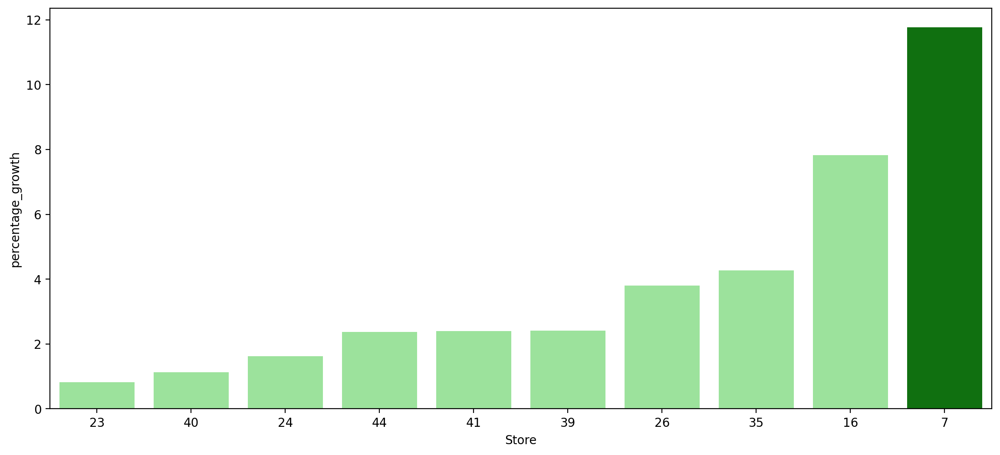

In [46]:
plt.figure(figsize = (14,6), dpi=200)
cols = ['green' if (x == max(Positive_growth.percentage_growth)) else 'lightgreen' for x in Positive_growth.percentage_growth]
sns.barplot(data= Positive_growth, x = Positive_growth.index, y='percentage_growth', order=Positive_growth.sort_values('percentage_growth').index, palette=cols);

## Some holidays have a negative impact on sales. Find out holidays which have higher sales than the mean sales in non-holiday season for all stores together

In [47]:
df.head()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,year,month,Quarter
0,1,2010-02-05,1643690.90,0,42.31,2.572,211.096358,8.106,2010,2,1
1,1,2010-02-12,1641957.44,1,38.51,2.548,211.242170,8.106,2010,2,1
2,1,2010-02-19,1611968.17,0,39.93,2.514,211.289143,8.106,2010,2,1
3,1,2010-02-26,1409727.59,0,46.63,2.561,211.319643,8.106,2010,2,1
4,1,2010-03-05,1554806.68,0,46.50,2.625,211.350143,8.106,2010,3,1


Super Bowl: 12-Feb-10, 11-Feb-11, 10-Feb-12, 8-Feb-13
Labour Day: 10-Sep-10, 9-Sep-11, 7-Sep-12, 6-Sep-13
Thanksgiving: 26-Nov-10, 25-Nov-11, 23-Nov-12, 29-Nov-13
Christmas: 31-Dec-10, 30-Dec-11, 28-Dec-12, 27-Dec-13

In [48]:
Holidays_data = pd.DataFrame(df[df['Holiday_Flag'] == 1])

In [49]:
Holidays_data.head()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,year,month,Quarter
1,1,2010-02-12,1641957.44,1,38.51,2.548,211.242170,8.106,2010,2,1
31,1,2010-09-10,1507460.69,1,78.69,2.565,211.495190,7.787,2010,9,3
42,1,2010-11-26,1955624.11,1,64.52,2.735,211.748433,7.838,2010,11,4
47,1,2010-12-31,1367320.01,1,48.43,2.943,211.404932,7.838,2010,12,4
53,1,2011-02-11,1649614.93,1,36.39,3.022,212.936705,7.742,2011,2,1


In [50]:
Holidays_data.month.nunique()

4

In [51]:
Holidays_data.Holiday_Flag.value_counts()

1    450
Name: Holiday_Flag, dtype: int64

In [52]:
Holidays_mean_sales = pd.DataFrame(Holidays_data.groupby('month').mean('Weekly_Sales').round(2))

In [53]:
Holidays_mean_sales

,Store,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,year,Quarter
month,,,,,,,,,
2,23.0,1079127.99,1.0,35.39,3.12,170.63,8.14,2011.0,1.0
9,23.0,1042427.29,1.0,74.65,3.42,172.11,7.92,2011.0,3.0
11,23.0,1471273.43,1.0,48.76,3.18,170.98,8.14,2010.5,4.0
12,23.0,960833.11,1.0,37.35,3.16,171.26,8.14,2010.5,4.0


In [54]:
df_q3.rename(columns={'Weekly_Sales': 'Weekly sales_Q3'}, inplace = True)
Holidays_mean_sales.reset_index(inplace = True)
Holidays_mean_sales

,month,Store,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,year,Quarter
0,2,23.0,1079127.99,1.0,35.39,3.12,170.63,8.14,2011.0,1.0
1,9,23.0,1042427.29,1.0,74.65,3.42,172.11,7.92,2011.0,3.0
2,11,23.0,1471273.43,1.0,48.76,3.18,170.98,8.14,2010.5,4.0
3,12,23.0,960833.11,1.0,37.35,3.16,171.26,8.14,2010.5,4.0


In [55]:
Holidays_mean_sales['month'] = Holidays_mean_sales['month'].map({2: 'Super Bowl', 9: 'Labour Day', 11: 'Thanksgiving', 12: 'Christmas'})

In [56]:
df6 = Holidays_mean_sales[['month', 'Weekly_Sales']]

In [57]:
df.head()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,year,month,Quarter
0,1,2010-02-05,1643690.90,0,42.31,2.572,211.096358,8.106,2010,2,1
1,1,2010-02-12,1641957.44,1,38.51,2.548,211.242170,8.106,2010,2,1
2,1,2010-02-19,1611968.17,0,39.93,2.514,211.289143,8.106,2010,2,1
3,1,2010-02-26,1409727.59,0,46.63,2.561,211.319643,8.106,2010,2,1
4,1,2010-03-05,1554806.68,0,46.50,2.625,211.350143,8.106,2010,3,1


In [58]:
Non_Holiday_mean_sales = df[df['Holiday_Flag'] ==0]['Weekly_Sales'].mean()
Non_Holiday_mean_sales

1041256.3802088564

In [59]:
df6.loc[len(df.index)] = ['Non Holidays mean sales', 1041256.38 ]
df6.set_index('month')

C:\Users\Bharg\AppData\Local\Temp\ipykernel_13244\4229879942.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df6.loc[len(df.index)] = ['Non Holidays mean sales', 1041256.38 ]


,Weekly_Sales
month,
Super Bowl,1079127.99
Labour Day,1042427.29
Thanksgiving,1471273.43
Christmas,960833.11
Non Holidays mean sales,1041256.38


In [60]:
df6.sort_values(by = 'Weekly_Sales', ascending=False)

,month,Weekly_Sales
2,Thanksgiving,1471273.43
0,Super Bowl,1079127.99
1,Labour Day,1042427.29
6435,Non Holidays mean sales,1041256.38
3,Christmas,960833.11


## Provide a monthly and semester view of sales in units and give insights

In [61]:
df.head()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,year,month,Quarter
0,1,2010-02-05,1643690.90,0,42.31,2.572,211.096358,8.106,2010,2,1
1,1,2010-02-12,1641957.44,1,38.51,2.548,211.242170,8.106,2010,2,1
2,1,2010-02-19,1611968.17,0,39.93,2.514,211.289143,8.106,2010,2,1
3,1,2010-02-26,1409727.59,0,46.63,2.561,211.319643,8.106,2010,2,1
4,1,2010-03-05,1554806.68,0,46.50,2.625,211.350143,8.106,2010,3,1


In [62]:
months = np.arange(1, 13).tolist()
months

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]

In [63]:
df[(df['year'] == 2010) & (df['month'].isin(months))]

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,year,month,Quarter
0,1,2010-02-05,1643690.90,0,42.31,2.572,211.096358,8.106,2010,2,1
1,1,2010-02-12,1641957.44,1,38.51,2.548,211.242170,8.106,2010,2,1
2,1,2010-02-19,1611968.17,0,39.93,2.514,211.289143,8.106,2010,2,1
3,1,2010-02-26,1409727.59,0,46.63,2.561,211.319643,8.106,2010,2,1
4,1,2010-03-05,1554806.68,0,46.50,2.625,211.350143,8.106,2010,3,1
...,...,...,...,...,...,...,...,...,...,...,...
6335,45,2010-12-03,879244.90,0,40.93,3.046,182.667615,8.724,2010,12,4
6336,45,2010-12-10,1002364.34,0,30.54,3.109,182.551954,8.724,2010,12,4
6337,45,2010-12-17,1123282.85,0,30.51,3.140,182.517732,8.724,2010,12,4
6338,45,2010-12-24,1682862.03,0,30.59,3.141,182.544590,8.724,2010,12,4


In [64]:
df.groupby(['year', 'month'])['Weekly_Sales'].sum().astype('int64')

year  month
2010  2        190332983
      3        181919802
      4        231412368
      5        186710934
      6        192246172
      7        232580125
      8        187640110
      9        177267896
      10       217161824
      11       202853370
      12       288760532
2011  1        163703966
      2        186331327
      3        179356448
      4        226526510
      5        181648158
      6        189773385
      7        229911398
      8        188599332
      9        220847738
      10       183261283
      11       210162354
      12       288078102
2012  1        168894471
      2        192063579
      3        231509650
      4        188920905
      5        188766479
      6        240610329
      7        187509452
      8        236850765
      9        180645544
      10       184361680
Name: Weekly_Sales, dtype: int64

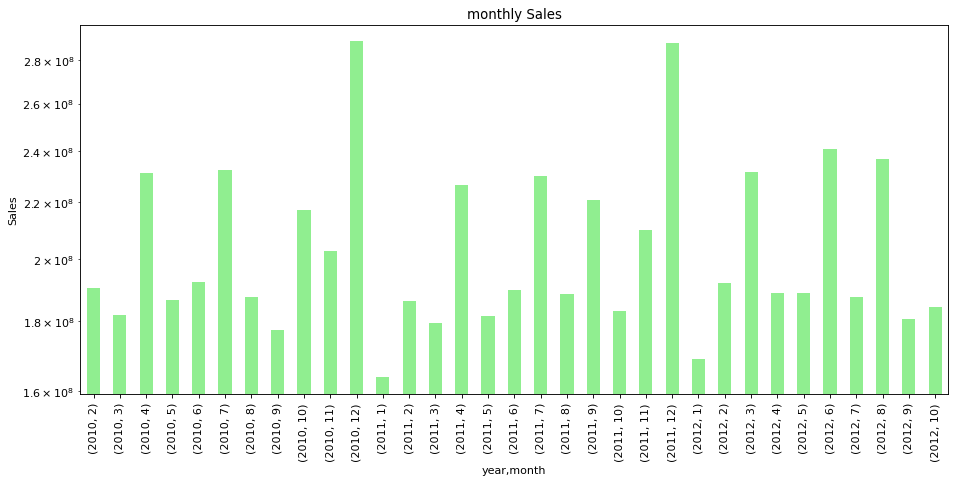

In [65]:
plt.figure(figsize=(14,6), dpi=80)
df.groupby(['year', 'month'])['Weekly_Sales'].sum().plot(kind='bar', legend=False, color = 'lightgreen', logy = True, ylabel = 'Sales')
plt.title('monthly Sales');

In [66]:
df.groupby(['year', 'Quarter'])['Weekly_Sales'].sum().astype('int64')

year  Quarter
2010  1          372252785
      2          610369474
      3          597488133
      4          708775726
2011  1          529391742
      2          597948054
      3          639358469
      4          681501740
2012  1          592467701
      2          618297714
      3          605005762
      4          184361680
Name: Weekly_Sales, dtype: int64

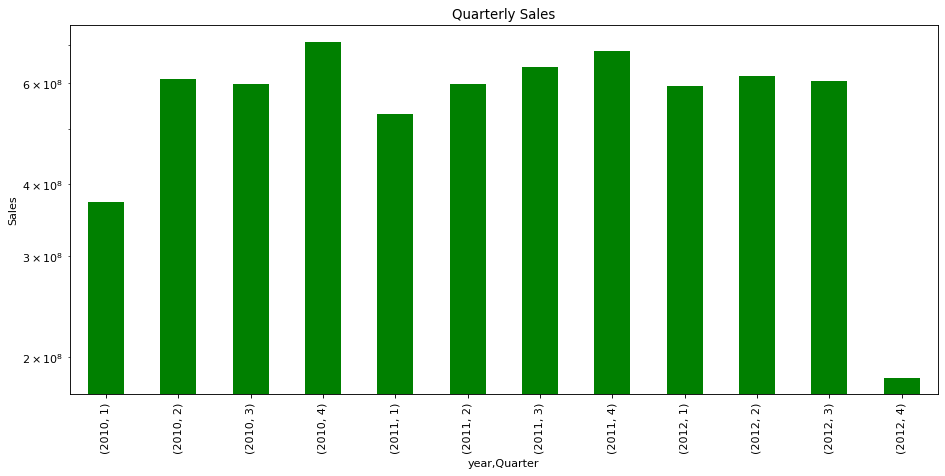

In [67]:
plt.figure(figsize=(14,6), dpi=80)
df.groupby(['year', 'Quarter'])['Weekly_Sales'].sum().plot(kind='bar', color= 'green', legend=False, logy = True, ylabel = 'Sales')
plt.title('Quarterly Sales');

# Machine Learning Model Implementation.

# Exploratory Data Analysis(EDA)

In [68]:
df.head()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,year,month,Quarter
0,1,2010-02-05,1643690.90,0,42.31,2.572,211.096358,8.106,2010,2,1
1,1,2010-02-12,1641957.44,1,38.51,2.548,211.242170,8.106,2010,2,1
2,1,2010-02-19,1611968.17,0,39.93,2.514,211.289143,8.106,2010,2,1
3,1,2010-02-26,1409727.59,0,46.63,2.561,211.319643,8.106,2010,2,1
4,1,2010-03-05,1554806.68,0,46.50,2.625,211.350143,8.106,2010,3,1


In [69]:
df.head()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,year,month,Quarter
0,1,2010-02-05,1643690.90,0,42.31,2.572,211.096358,8.106,2010,2,1
1,1,2010-02-12,1641957.44,1,38.51,2.548,211.242170,8.106,2010,2,1
2,1,2010-02-19,1611968.17,0,39.93,2.514,211.289143,8.106,2010,2,1
3,1,2010-02-26,1409727.59,0,46.63,2.561,211.319643,8.106,2010,2,1
4,1,2010-03-05,1554806.68,0,46.50,2.625,211.350143,8.106,2010,3,1


In [70]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Store,6435.0,2.300000e+01,12.988182,1.000,12.000,23.000000,3.400000e+01,4.500000e+01
Weekly_Sales,6435.0,1.046965e+06,564366.622054,209986.250,553350.105,960746.040000,1.420159e+06,3.818686e+06
Holiday_Flag,6435.0,6.993007e-02,0.255049,0.000,0.000,0.000000,0.000000e+00,1.000000e+00
Temperature,6435.0,6.066378e+01,18.444933,-2.060,47.460,62.670000,7.494000e+01,1.001400e+02
Fuel_Price,6435.0,3.358607e+00,0.459020,2.472,2.933,3.445000,3.735000e+00,4.468000e+00
CPI,6435.0,1.715784e+02,39.356712,126.064,131.735,182.616521,2.127433e+02,2.272328e+02
Unemployment,6435.0,7.999151e+00,1.875885,3.879,6.891,7.874000,8.622000e+00,1.431300e+01
year,6435.0,2.010965e+03,0.797019,2010.000,2010.000,2011.000000,2.012000e+03,2.012000e+03
month,6435.0,6.447552e+00,3.238308,1.000,4.000,6.000000,9.000000e+00,1.200000e+01
Quarter,6435.0,2.482517e+00,1.070036,1.000,2.000,2.000000,3.000000e+00,4.000000e+00


In [71]:
df.corr()['Weekly_Sales'].sort_values()

Store          -0.335332
Unemployment   -0.106176
CPI            -0.072634
Temperature    -0.063810
year           -0.018378
Fuel_Price      0.009464
Holiday_Flag    0.036891
Quarter         0.063363
month           0.076143
Weekly_Sales    1.000000
Name: Weekly_Sales, dtype: float64

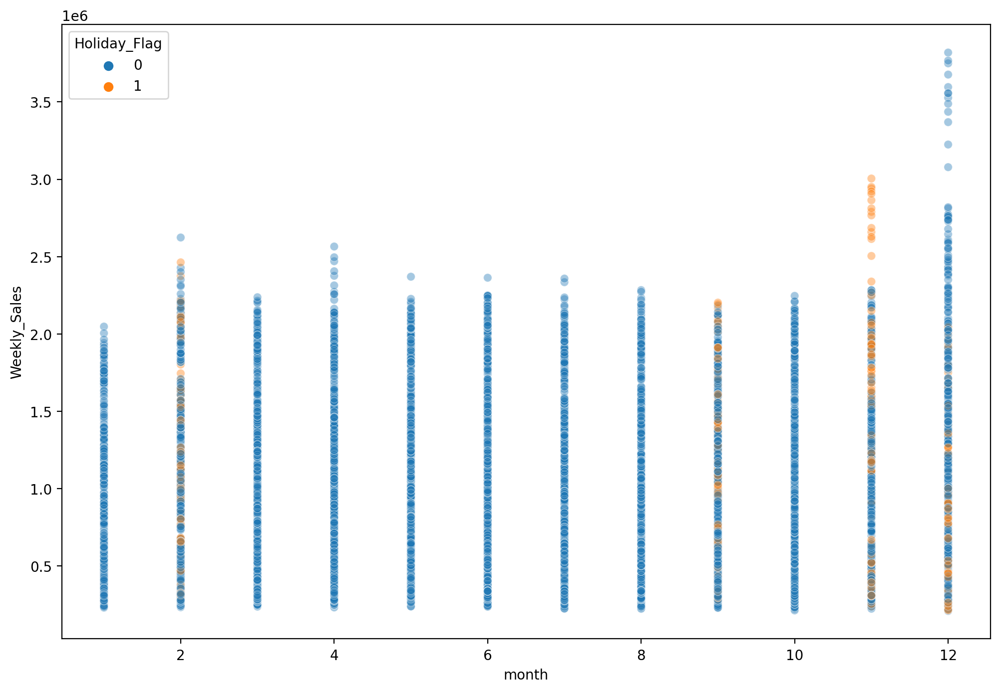

In [72]:
plt.figure(figsize=(12,8),dpi =200)
sns.scatterplot(data = df, x='month', y ='Weekly_Sales', hue = 'Holiday_Flag',alpha = 0.4);

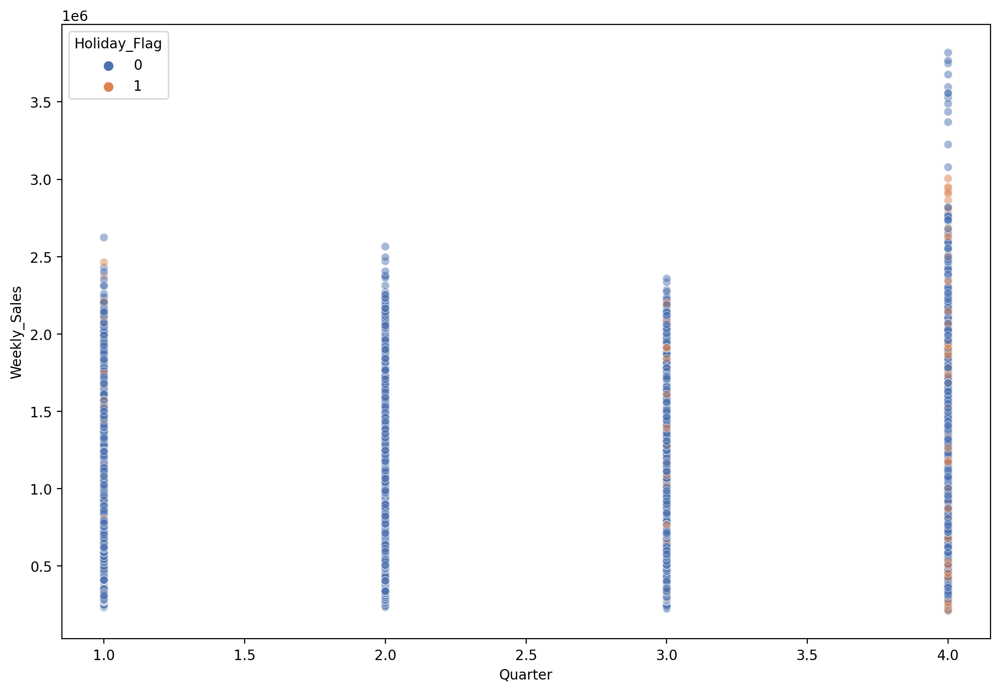

In [73]:
plt.figure(figsize=(12,8),dpi =200)
sns.scatterplot(data = df, x='Quarter', y ='Weekly_Sales', hue = 'Holiday_Flag', alpha = 0.5, palette = 'deep');

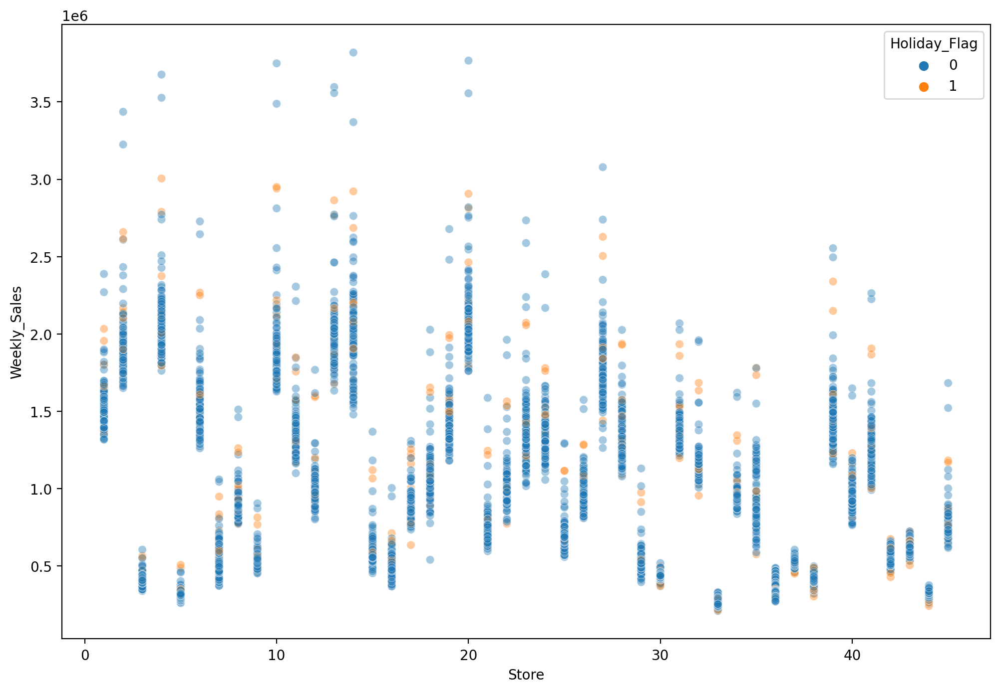

In [74]:
plt.figure(figsize=(12,8),dpi =200)
sns.scatterplot(data = df, x='Store', y ='Weekly_Sales', hue = 'Holiday_Flag', alpha = 0.4);

In [75]:
stores = np.arange(1, 21).tolist()
stores

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]

In [76]:
df[(df['Weekly_Sales'] >= 3500000) & (df['Store'].isin(stores))]

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,year,month,Quarter
475,4,2010-12-24,3526713.39,0,43.21,2.887,126.983581,7.127,2010,12,4
527,4,2011-12-23,3676388.98,0,35.92,3.103,129.984548,5.143,2011,12,4
1333,10,2010-12-24,3749057.69,0,57.06,3.236,126.983581,9.003,2010,12,4
1762,13,2010-12-24,3595903.20,0,34.90,2.846,126.983581,7.795,2010,12,4
1814,13,2011-12-23,3556766.03,0,24.76,3.186,129.984548,6.392,2011,12,4
1905,14,2010-12-24,3818686.45,0,30.59,3.141,182.544590,8.724,2010,12,4
2763,20,2010-12-24,3766687.43,0,25.17,3.141,204.637673,7.484,2010,12,4
2815,20,2011-12-23,3555371.03,0,40.19,3.389,212.236040,7.082,2011,12,4


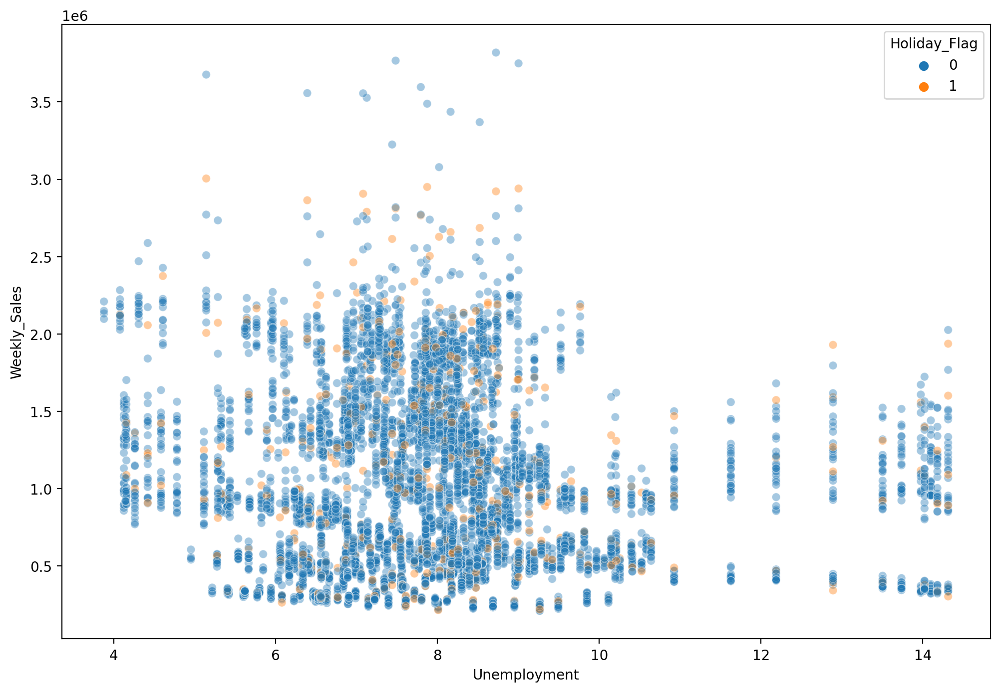

In [77]:
plt.figure(figsize=(12,8),dpi =200)
sns.scatterplot(data = df, x='Unemployment', y ='Weekly_Sales', hue = 'Holiday_Flag',alpha = 0.4);

In [78]:
df[(df['Weekly_Sales'] >= 3500000) & ((df['Unemployment'] > 6) & (df['Unemployment'] < 10))]

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,year,month,Quarter
475,4,2010-12-24,3526713.39,0,43.21,2.887,126.983581,7.127,2010,12,4
1333,10,2010-12-24,3749057.69,0,57.06,3.236,126.983581,9.003,2010,12,4
1762,13,2010-12-24,3595903.20,0,34.90,2.846,126.983581,7.795,2010,12,4
1814,13,2011-12-23,3556766.03,0,24.76,3.186,129.984548,6.392,2011,12,4
1905,14,2010-12-24,3818686.45,0,30.59,3.141,182.544590,8.724,2010,12,4
2763,20,2010-12-24,3766687.43,0,25.17,3.141,204.637673,7.484,2010,12,4
2815,20,2011-12-23,3555371.03,0,40.19,3.389,212.236040,7.082,2011,12,4


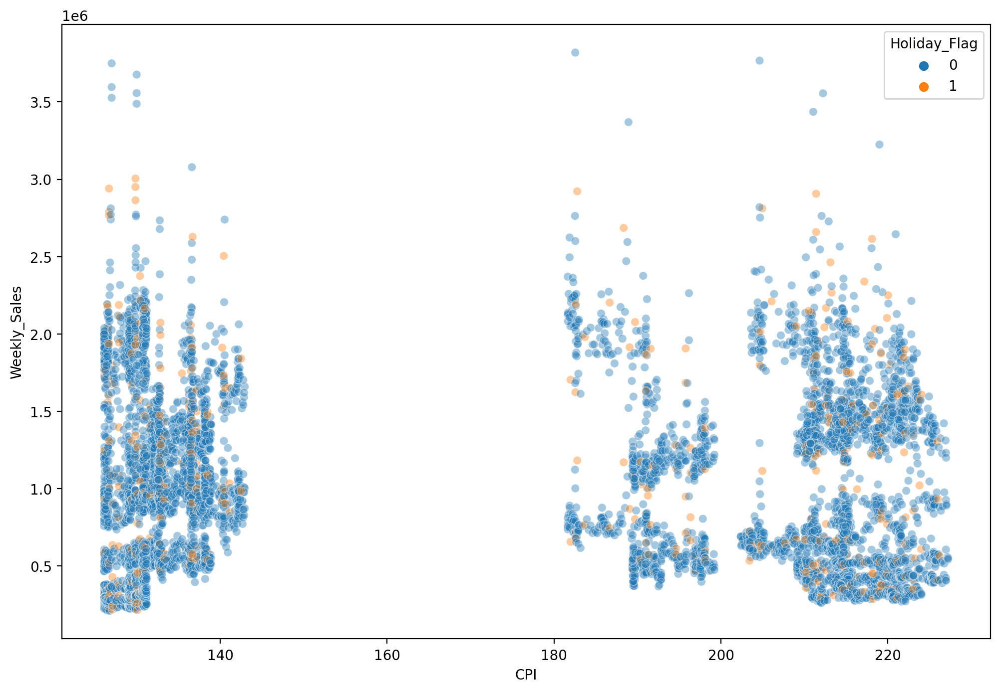

In [79]:
plt.figure(figsize=(12,8),dpi =200)
sns.scatterplot(data = df, x='CPI', y ='Weekly_Sales', hue = 'Holiday_Flag',alpha = 0.4);

In [80]:
df[(df['Weekly_Sales'] >= 3450000) & ((df['CPI'] < 150.0) | (df['CPI'] >180.0))]

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,year,month,Quarter
475,4,2010-12-24,3526713.39,0,43.21,2.887,126.983581,7.127,2010,12,4
527,4,2011-12-23,3676388.98,0,35.92,3.103,129.984548,5.143,2011,12,4
1333,10,2010-12-24,3749057.69,0,57.06,3.236,126.983581,9.003,2010,12,4
1385,10,2011-12-23,3487986.89,0,48.36,3.541,129.984548,7.874,2011,12,4
1762,13,2010-12-24,3595903.20,0,34.90,2.846,126.983581,7.795,2010,12,4
1814,13,2011-12-23,3556766.03,0,24.76,3.186,129.984548,6.392,2011,12,4
1905,14,2010-12-24,3818686.45,0,30.59,3.141,182.544590,8.724,2010,12,4
2763,20,2010-12-24,3766687.43,0,25.17,3.141,204.637673,7.484,2010,12,4
2815,20,2011-12-23,3555371.03,0,40.19,3.389,212.236040,7.082,2011,12,4


In [81]:
df.columns

Index(['Store', 'Date', 'Weekly_Sales', 'Holiday_Flag', 'Temperature',
       'Fuel_Price', 'CPI', 'Unemployment', 'year', 'month', 'Quarter'],
      dtype='object')

<Figure size 2100x900 with 0 Axes>

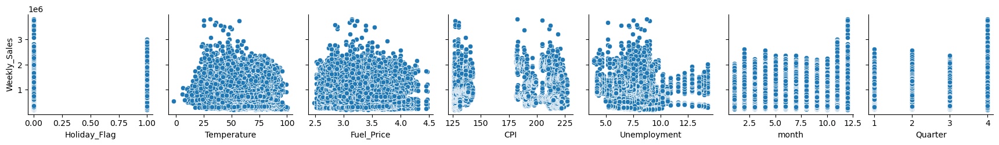

In [82]:
plt.figure(figsize=(14,6),dpi=150)
sns.pairplot(df, x_vars=["Holiday_Flag", "Temperature", 'Fuel_Price', 'CPI', 'Unemployment', 'month', 'Quarter'],
                 y_vars=['Weekly_Sales']);

In [83]:
df.head()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,year,month,Quarter
0,1,2010-02-05,1643690.90,0,42.31,2.572,211.096358,8.106,2010,2,1
1,1,2010-02-12,1641957.44,1,38.51,2.548,211.242170,8.106,2010,2,1
2,1,2010-02-19,1611968.17,0,39.93,2.514,211.289143,8.106,2010,2,1
3,1,2010-02-26,1409727.59,0,46.63,2.561,211.319643,8.106,2010,2,1
4,1,2010-03-05,1554806.68,0,46.50,2.625,211.350143,8.106,2010,3,1


In [84]:
df.drop(['Date'], axis = 1, inplace = True)

In [85]:
df.head()

,Store,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,year,month,Quarter
0,1,1643690.90,0,42.31,2.572,211.096358,8.106,2010,2,1
1,1,1641957.44,1,38.51,2.548,211.242170,8.106,2010,2,1
2,1,1611968.17,0,39.93,2.514,211.289143,8.106,2010,2,1
3,1,1409727.59,0,46.63,2.561,211.319643,8.106,2010,2,1
4,1,1554806.68,0,46.50,2.625,211.350143,8.106,2010,3,1


# CHECKING FOR OUTLIERS

C:\Users\Bharg\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Bharg\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Bharg\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Bharg\anaconda3\lib\si

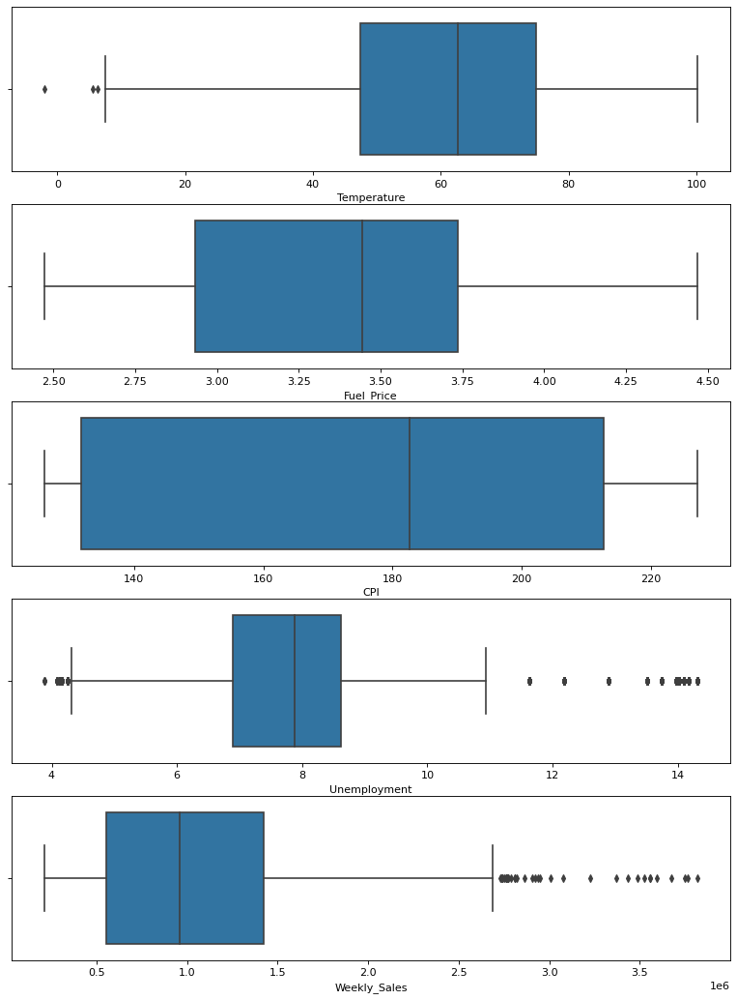

In [86]:
fig, axis = plt.subplots(5, figsize=(12,16), dpi=80)
outliers = df[['Temperature','Fuel_Price','CPI','Unemployment', 'Weekly_Sales']]

for i, column in enumerate(outliers):
    sns.boxplot(df[column], ax=axis[i])

import warnings
warnings.filterwarnings('ignore')

# REMOVAL OF OUTLIERS

In [87]:
df = df[df['Unemployment'] <= 10.5]
df = df[df['Unemployment'] >= 4.7]
df = df[df['Temperature'] >= 8]

In [88]:
'''num_features = ['Temperature','Fuel_Price','CPI','Unemployment','Weekly_Sales']
for feature in num_features:
    q1 = df[feature].quantile(0.25)
    q3 = df[feature].quantile(0.75)
    iqr = q3-q1
    lower = q1 - 1.5*iqr
    upper = q3 + 1.5*iqr
    df = df[(df[feature] >= lower) & (df[feature] <= upper)]'''

"num_features = ['Temperature','Fuel_Price','CPI','Unemployment','Weekly_Sales']\nfor feature in num_features:\n    q1 = df[feature].quantile(0.25)\n    q3 = df[feature].quantile(0.75)\n    iqr = q3-q1\n    lower = q1 - 1.5*iqr\n    upper = q3 + 1.5*iqr\n    df = df[(df[feature] >= lower) & (df[feature] <= upper)]"

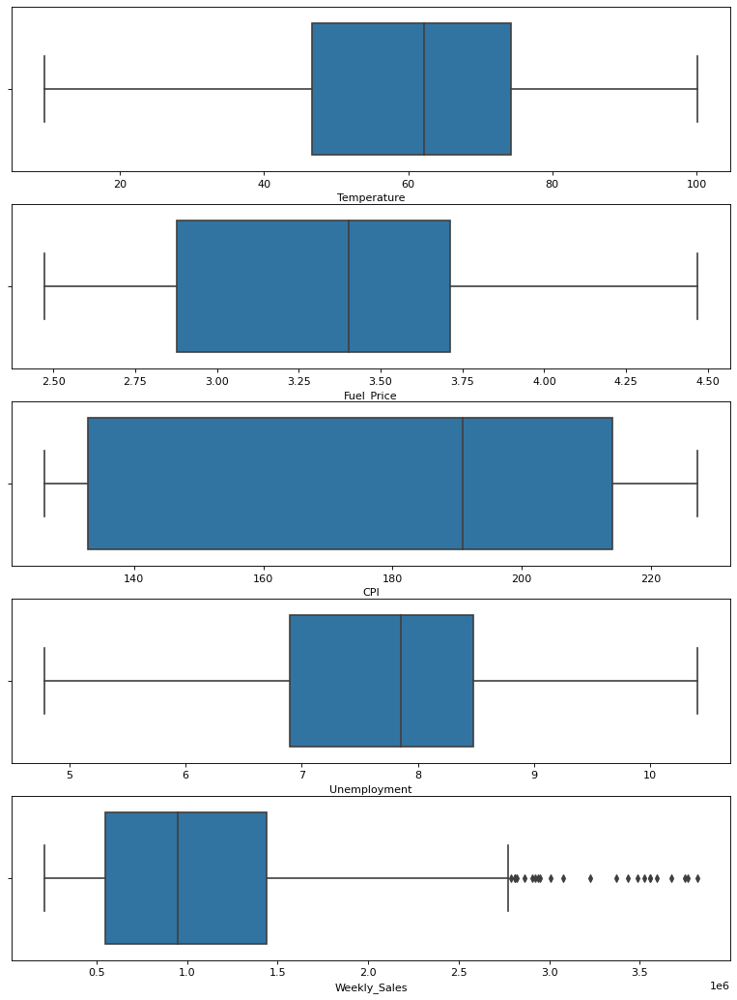

In [89]:
fig, axis = plt.subplots(5, figsize=(12,16), dpi=80)
outliers = df[['Temperature','Fuel_Price','CPI','Unemployment', 'Weekly_Sales']]

for i, column in enumerate(outliers):
    sns.boxplot(df[column], ax=axis[i])

import warnings
warnings.filterwarnings('ignore')

In [90]:
len(df)

5763

In [91]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5763 entries, 0 to 6434
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Store         5763 non-null   int64  
 1   Weekly_Sales  5763 non-null   float64
 2   Holiday_Flag  5763 non-null   int64  
 3   Temperature   5763 non-null   float64
 4   Fuel_Price    5763 non-null   float64
 5   CPI           5763 non-null   float64
 6   Unemployment  5763 non-null   float64
 7   year          5763 non-null   int64  
 8   month         5763 non-null   int64  
 9   Quarter       5763 non-null   int64  
dtypes: float64(5), int64(5)
memory usage: 495.3 KB


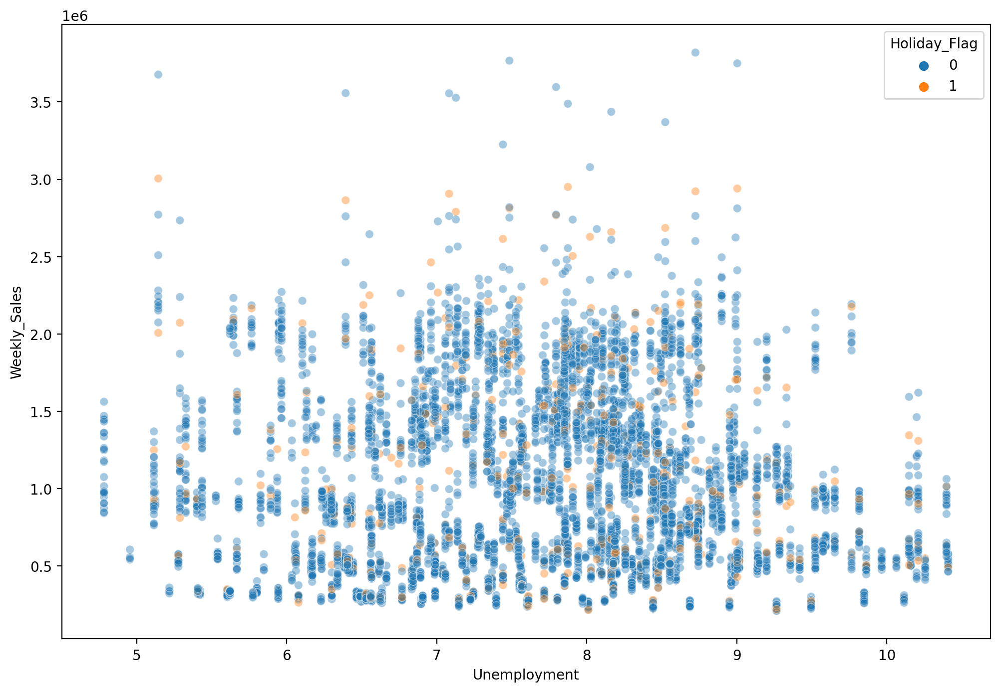

In [92]:
plt.figure(figsize=(12,8),dpi =200)
sns.scatterplot(data = df, x='Unemployment', y ='Weekly_Sales', hue = 'Holiday_Flag',alpha = 0.4);

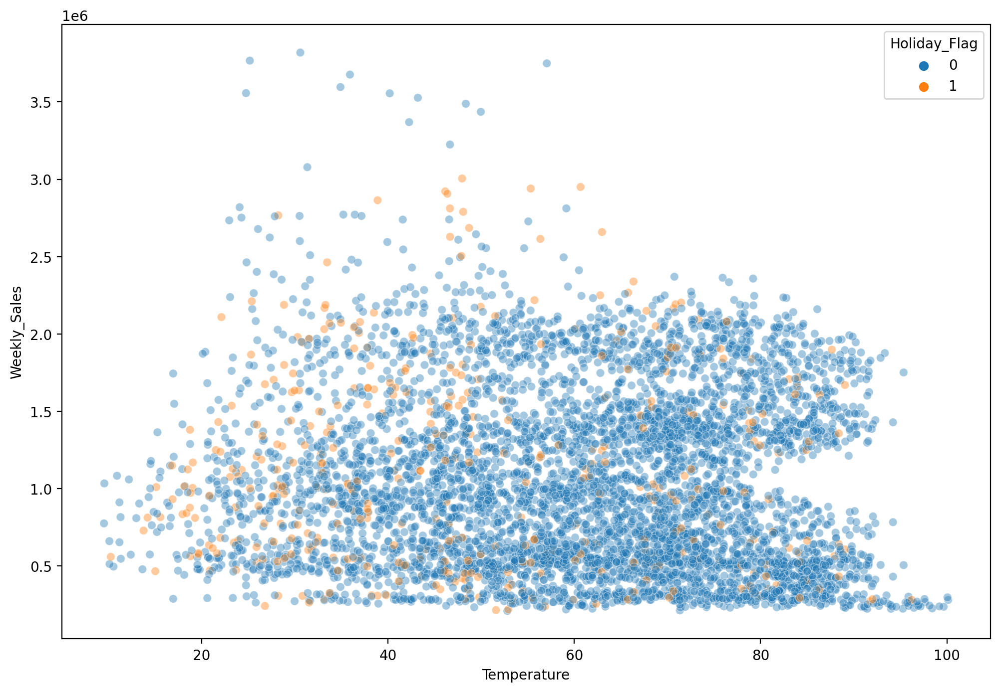

In [93]:
plt.figure(figsize=(12,8),dpi =200)
sns.scatterplot(data = df, x='Temperature', y ='Weekly_Sales', hue = 'Holiday_Flag',alpha = 0.4);

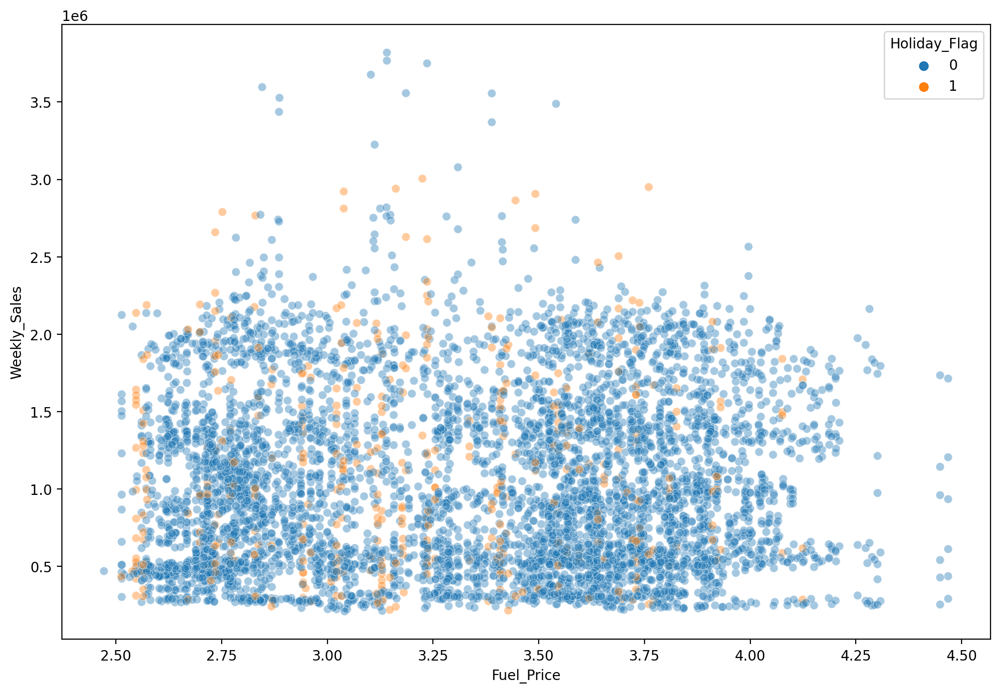

In [94]:
plt.figure(figsize=(12,8),dpi =200)
sns.scatterplot(data = df, x='Fuel_Price', y ='Weekly_Sales', hue = 'Holiday_Flag',alpha = 0.4);

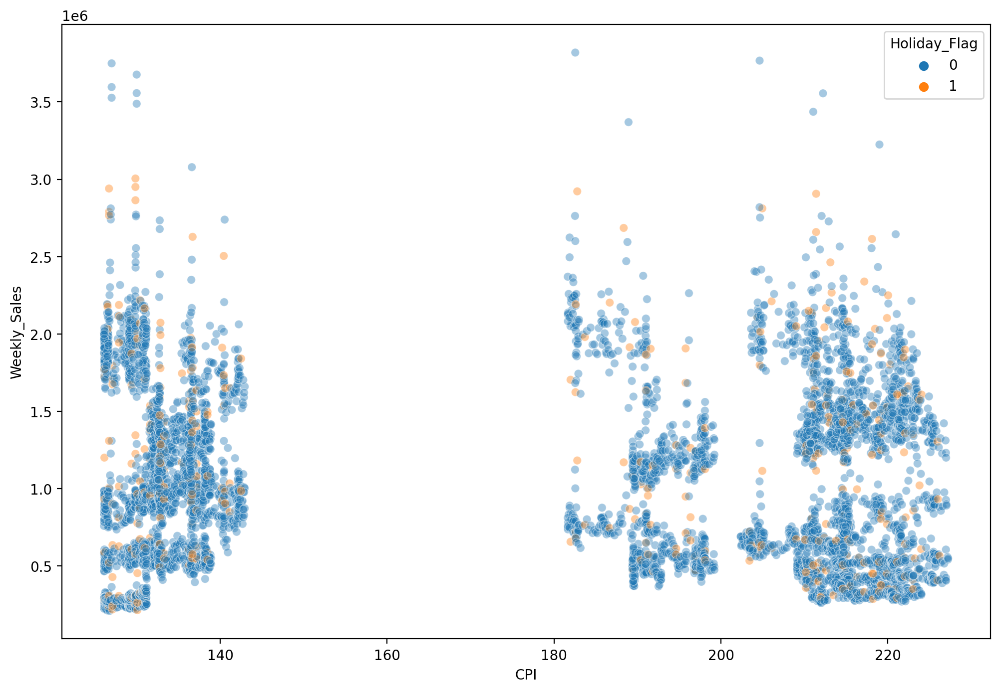

In [95]:
plt.figure(figsize=(12,8),dpi =200)
sns.scatterplot(data = df, x='CPI', y ='Weekly_Sales', hue = 'Holiday_Flag',alpha = 0.4);

In [96]:
df.head()

,Store,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,year,month,Quarter
0,1,1643690.90,0,42.31,2.572,211.096358,8.106,2010,2,1
1,1,1641957.44,1,38.51,2.548,211.242170,8.106,2010,2,1
2,1,1611968.17,0,39.93,2.514,211.289143,8.106,2010,2,1
3,1,1409727.59,0,46.63,2.561,211.319643,8.106,2010,2,1
4,1,1554806.68,0,46.50,2.625,211.350143,8.106,2010,3,1


In [97]:
x = df[['Store', 'Fuel_Price', 'CPI', 'Unemployment', 'month', 'year']]
y = df['Weekly_Sales']

In [98]:
x.head()

,Store,Fuel_Price,CPI,Unemployment,month,year
0,1,2.572,211.096358,8.106,2,2010
1,1,2.548,211.242170,8.106,2,2010
2,1,2.514,211.289143,8.106,2,2010
3,1,2.561,211.319643,8.106,2,2010
4,1,2.625,211.350143,8.106,3,2010


In [99]:
y.head()

0    1643690.90
1    1641957.44
2    1611968.17
3    1409727.59
4    1554806.68
Name: Weekly_Sales, dtype: float64

In [100]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2)

In [101]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
x_train = sc.fit_transform(x_train)
x_test = sc.fit_transform(x_test)

# Linear regression

* Linear Regression *

Train Accuracy Score: 13.126 %
Test Accuracy Score: 11.347999999999999 %
Mean Absolute Error: 444723.664
Mean Squared Error: 290304824731.137
Root Mean Squared Error: 538799.429


<AxesSubplot:xlabel='Weekly_Sales'>

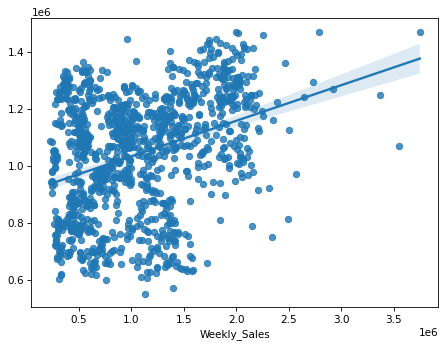

In [102]:
from sklearn.linear_model import LinearRegression
from sklearn import metrics
from sklearn.metrics import r2_score

lr = LinearRegression()
lr.fit(x_train, y_train)
lr_y_pred = lr.predict(x_test)

print('* Linear Regression *\n')

print('Train Accuracy Score:', lr.score(x_train, y_train).round(5)*100, '%')
print('Test Accuracy Score:', r2_score(y_test, lr_y_pred).round(5)*100, '%')

print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, lr_y_pred).round(3))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, lr_y_pred).round(3))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, lr_y_pred)).round(3))

plt.figure(figsize=(7,5), dpi=75)
sns.regplot(y_test, lr_y_pred)

# Random Forest Regressor

* Random Forest Regressor *

Accuracy                 = 91.25999999999999 %
Mean Absolute Error      = 83734.80887
Mean Squared Error       = 28621592799.83577
Root Mean Squared Error  = 169179.17366


<AxesSubplot:xlabel='Weekly_Sales'>

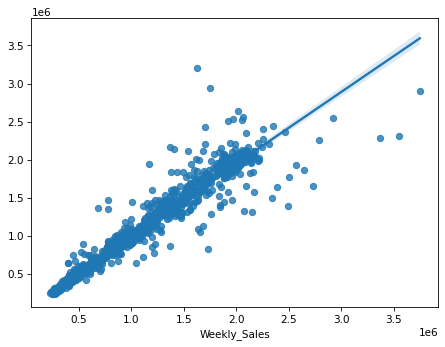

In [103]:
from sklearn.ensemble import RandomForestRegressor
rfr = RandomForestRegressor()
rfr.fit(x_train,y_train)

rfr_y_pred = rfr.predict(x_test)

R2_rfr = r2_score(y_test, rfr_y_pred)
mae = metrics.mean_absolute_error(y_test, rfr_y_pred)
mse = metrics.mean_squared_error(y_test, rfr_y_pred)
rmse = np.sqrt(metrics.mean_squared_error(y_test, rfr_y_pred))

print('* Random Forest Regressor *\n')

print('Accuracy                 =', R2_rfr.round(5)*100,'%')
print('Mean Absolute Error      =', mae.round(5))
print('Mean Squared Error       =', mse.round(5))
print('Root Mean Squared Error  =', rmse.round(5))

plt.figure(figsize=(7,5), dpi=75)
sns.regplot(y_test, rfr_y_pred)

# Decision Tree Regressor

* Decision Tree Regressor *

Accuracy                 = 83.91999999999999 %
Mean Absolute Error      = 110946.24637
Mean Squared Error       = 52655015572.40961
Root Mean Squared Error  = 229466.80713


<AxesSubplot:xlabel='Weekly_Sales'>

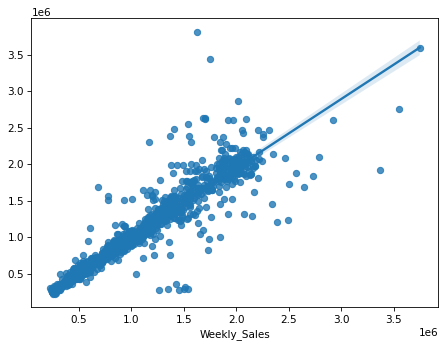

In [104]:
from sklearn.tree import DecisionTreeRegressor
dtr = DecisionTreeRegressor()
dtr.fit(x_train,y_train)

dtr_y_pred = dtr.predict(x_test)

R2_dtr = r2_score(y_test,dtr_y_pred)
mae = metrics.mean_absolute_error(y_test, dtr_y_pred)
mse = metrics.mean_squared_error(y_test, dtr_y_pred)
rmse = np.sqrt(metrics.mean_squared_error(y_test, dtr_y_pred))

print('* Decision Tree Regressor *\n')

print('Accuracy                 =', R2_dtr.round(5)*100,'%')
print('Mean Absolute Error      =', mae.round(5))
print('Mean Squared Error       =', mse.round(5))
print('Root Mean Squared Error  =', rmse.round(5))

plt.figure(figsize=(7,5), dpi=75)
sns.regplot(y_test, dtr_y_pred)

# KNN Regression

* KNearest Neighbors *

Accuracy                 = 70.658 %
Mean Absolute Error      = 198807.97999
Mean Squared Error       = 96083948118.24806
Root Mean Squared Error  = 309974.10879


<AxesSubplot:xlabel='Weekly_Sales'>

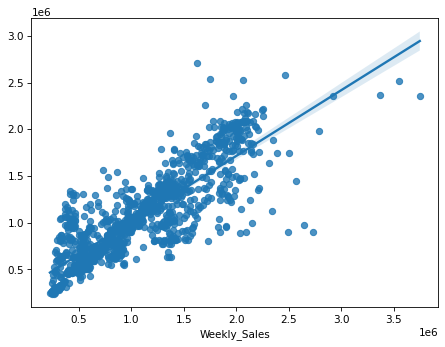

In [105]:
from sklearn.neighbors import KNeighborsRegressor
knn = KNeighborsRegressor()
knn.fit(x_train,y_train)

knn_y_pred = knn.predict(x_test)

R2_knn = r2_score(y_test, knn_y_pred)
mae = metrics.mean_absolute_error(y_test, knn_y_pred)
mse = metrics.mean_squared_error(y_test, knn_y_pred)
rmse = np.sqrt(metrics.mean_squared_error(y_test, knn_y_pred))

print('* KNearest Neighbors *\n')

print('Accuracy                 =', R2_knn.round(5)*100,'%')
print('Mean Absolute Error      =', mae.round(5))
print('Mean Squared Error       =', mse.round(5))
print('Root Mean Squared Error  =', rmse.round(5))

plt.figure(figsize=(7,5), dpi=75)
sns.regplot(y_test, knn_y_pred)

# CROSS VALIDATION

In [106]:
from sklearn.model_selection import cross_val_score

In [107]:
rfr_scores = cross_val_score(rfr, x_train,y_train, cv=10, scoring='r2')
print(rfr_scores)
print("Mean Score:", rfr_scores.mean()*100,'%')

[0.91118223 0.92653907 0.93310625 0.95300031 0.93620719 0.9428525
 0.93128037 0.91940966 0.94032338 0.95315443]
Mean Score: 93.47055395219733 %


In [108]:
dtr_scores = cross_val_score(dtr, x_train,y_train, cv=10, scoring='r2')
print(dtr_scores)
print("Mean Score:", dtr_scores.mean()*100,'%')

[0.91442732 0.88303587 0.92096883 0.92219028 0.9041807  0.92687039
 0.9043081  0.8992382  0.91508468 0.9498937 ]
Mean Score: 91.4019806894817 %
